## Fetal Health Classification using Machine Learning

In [86]:
import numpy as np # for mathematical operations
import pandas as pd # for data processing and analysis
import seaborn as sns # for data visualization
import matplotlib.pyplot as plt # for data visualization
import warnings # to ignore warnings
warnings.filterwarnings('ignore')
from sklearn.metrics import accuracy_score, classification_report
from sklearn.metrics import confusion_matrix


## Loading Data

In [87]:
df= pd.read_csv('fetal_health.csv')


In [88]:
# XGboost training expects labels start from 0
df['fetal_health'] = df['fetal_health'].astype('int') - 1

In [89]:
map = {0:'Normal',1:'Suspect',2:'Pathological'}
df['fetal_health'] = df['fetal_health'].map(map)


## Feature Relations Pair-Plot

<Figure size 800x640 with 0 Axes>

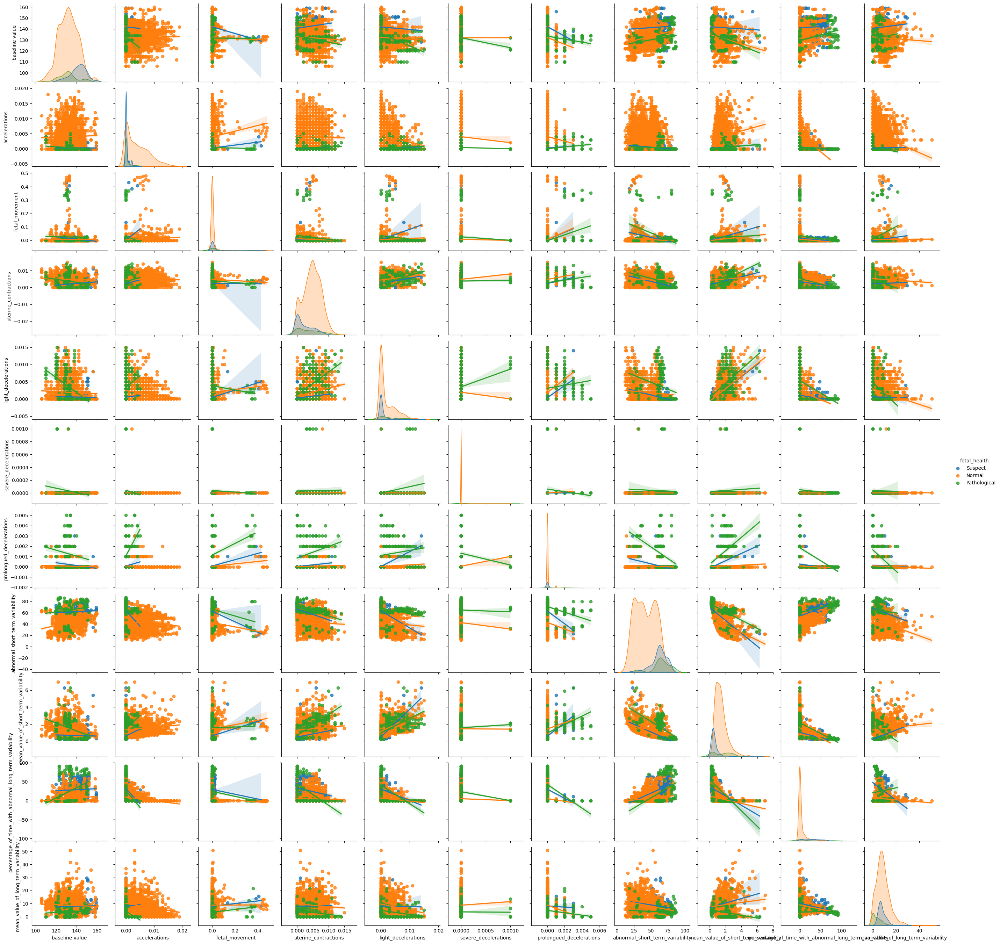

In [90]:
plt.figure(figsize=(10,8),dpi=80)
sns.pairplot(df[['baseline value', 'accelerations', 'fetal_movement',
       'uterine_contractions', 'light_decelerations', 'severe_decelerations',
       'prolongued_decelerations', 'abnormal_short_term_variability',
       'mean_value_of_short_term_variability',
       'percentage_of_time_with_abnormal_long_term_variability',
       'mean_value_of_long_term_variability','fetal_health']],kind='reg',hue='fetal_health')

<Figure size 800x640 with 0 Axes>

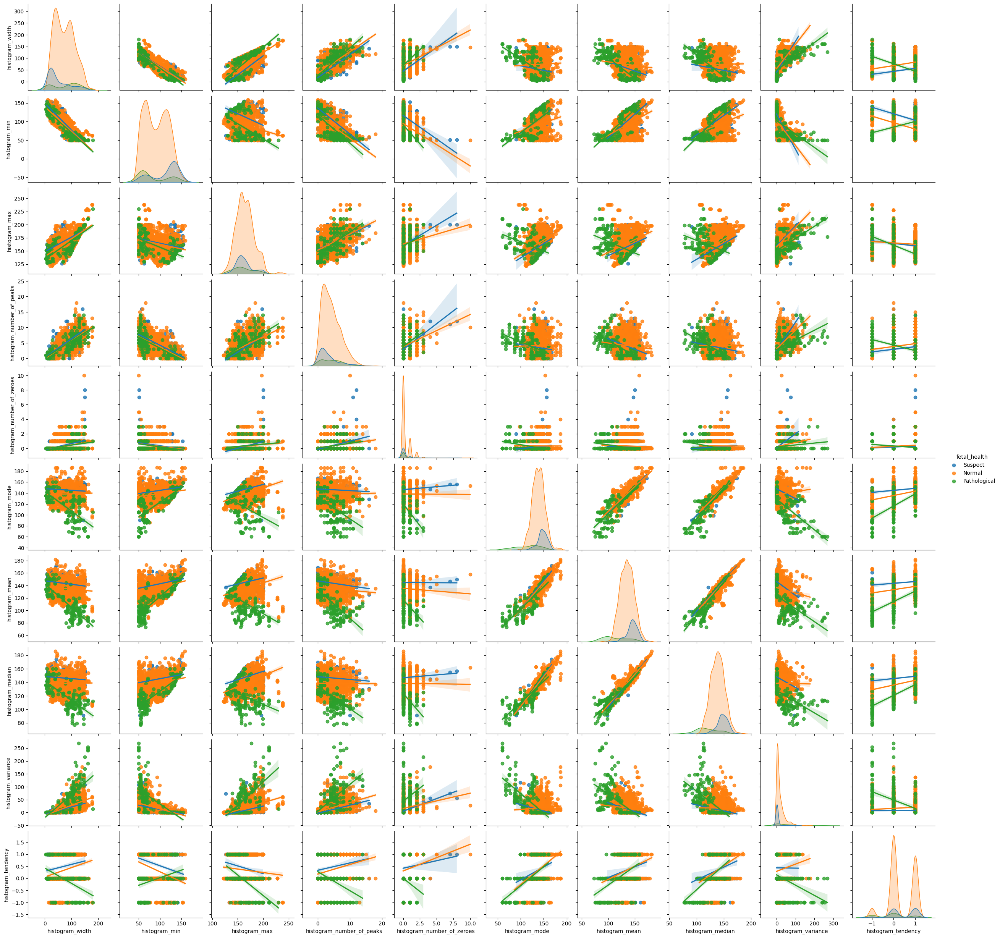

In [91]:
plt.figure(figsize=(10,8),dpi=80)
sns.pairplot(df[['histogram_width',
       'histogram_min', 'histogram_max', 'histogram_number_of_peaks',
       'histogram_number_of_zeroes', 'histogram_mode', 'histogram_mean',
       'histogram_median', 'histogram_variance', 'histogram_tendency','fetal_health']],kind='reg',hue='fetal_health')

## Understanding the split of Data Labels

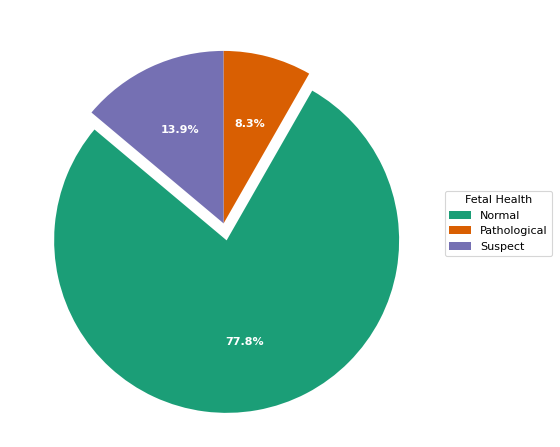

In [92]:
dat = df.groupby(['fetal_health']).size().reset_index(name='counts')
# Draw Plot
fig, ax = plt.subplots(figsize=(12, 7), subplot_kw=dict(aspect="equal"), dpi= 80)

data = dat['counts']
categories = dat['fetal_health']
explode = [0.1,0,0]

def func(pct, allvals):
    absolute = int(pct/100.*np.sum(allvals))
    return "{:.1f}%".format(pct)

wedges, texts, autotexts = ax.pie(data, 
                                  autopct=lambda pct: func(pct, data),
                                  textprops=dict(color="w"), 
                                  colors=plt.cm.Dark2.colors,
                                 startangle=140,
                                 explode=explode)

# Decoration
ax.legend(wedges, categories, title="Fetal Health", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))
plt.setp(autotexts, size=10, weight=700)
plt.show()


## Data Analysis

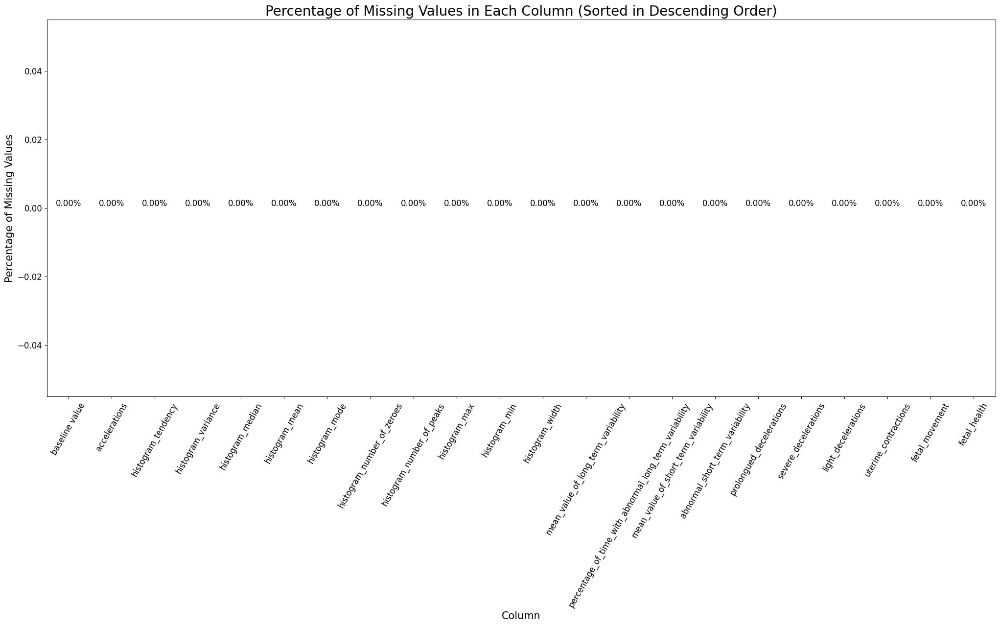

In [93]:
def plot_missing_values_bar(df):
    plt.figure(figsize=(25, 10))
    missing_values = df.isnull().mean().sort_values(ascending=False)
    missing_values.plot(kind='bar', color='blue')
    plt.title("Percentage of Missing Values in Each Column (Sorted in Descending Order)", fontsize=20)
    plt.xlabel("Column", fontsize=15)
    plt.ylabel("Percentage of Missing Values", fontsize=15)
    plt.xticks(rotation=60, fontsize=12)
    plt.yticks(fontsize=12)

    for i in range(df.shape[1]):
        plt.text(x=i, y=missing_values[i], s='{:.2f}%'.format(100*missing_values[i]), ha='center', va='bottom', fontsize=12)
    
plot_missing_values_bar(df) #plotting


In [94]:
for col in df.columns:
    print(col, " has ", len(df[col].unique()) , "values")

baseline value  has  48 values
accelerations  has  20 values
fetal_movement  has  102 values
uterine_contractions  has  16 values
light_decelerations  has  16 values
severe_decelerations  has  2 values
prolongued_decelerations  has  6 values
abnormal_short_term_variability  has  75 values
mean_value_of_short_term_variability  has  57 values
percentage_of_time_with_abnormal_long_term_variability  has  87 values
mean_value_of_long_term_variability  has  249 values
histogram_width  has  154 values
histogram_min  has  109 values
histogram_max  has  86 values
histogram_number_of_peaks  has  18 values
histogram_number_of_zeroes  has  9 values
histogram_mode  has  88 values
histogram_mean  has  103 values
histogram_median  has  95 values
histogram_variance  has  133 values
histogram_tendency  has  3 values
fetal_health  has  3 values


## Identifying target variable:

In [95]:
y = df['fetal_health']
X_data = df.drop(['fetal_health'], axis=1)

## Feature selection:
Using 1) Pearsons correlation and 2) KBest feature selection

#### 1) Pearsons correlation:

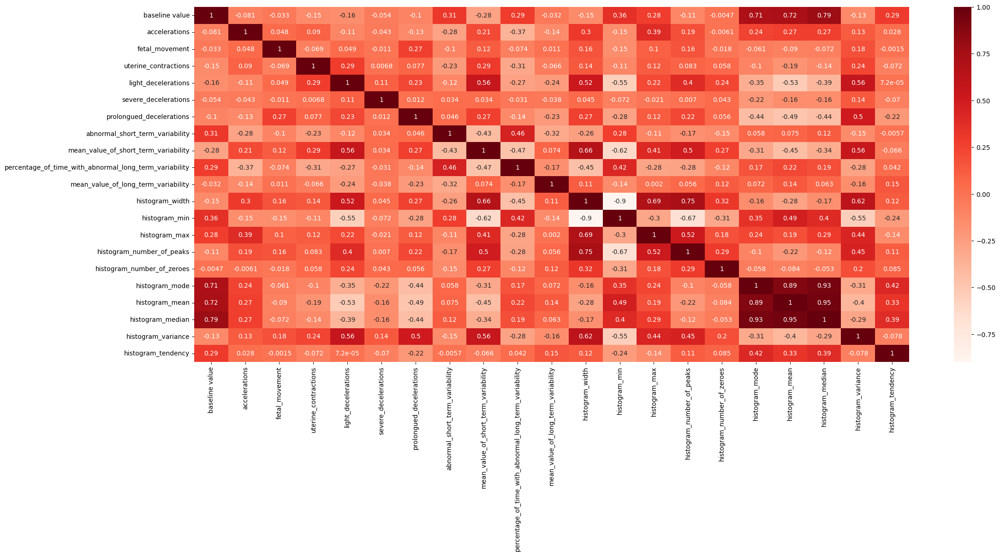

In [96]:
#Using Pearson Correlation
plt.figure(figsize=(25,10))
cor = df.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.Reds)
plt.show()

#### 2) KBest- Features:

In [97]:
from sklearn.feature_selection import SelectKBest, f_classif

selector = SelectKBest(f_classif, k=10)
X_important = selector.fit_transform(X_data, y)
mask = selector.get_support()
important_feature_names = X_data.columns[mask]

print(important_feature_names)

Index(['baseline value', 'accelerations', 'prolongued_decelerations',
       'abnormal_short_term_variability',
       'mean_value_of_short_term_variability',
       'percentage_of_time_with_abnormal_long_term_variability',
       'histogram_mode', 'histogram_mean', 'histogram_median',
       'histogram_variance'],
      dtype='object')


In [98]:
df.columns

Index(['baseline value', 'accelerations', 'fetal_movement',
       'uterine_contractions', 'light_decelerations', 'severe_decelerations',
       'prolongued_decelerations', 'abnormal_short_term_variability',
       'mean_value_of_short_term_variability',
       'percentage_of_time_with_abnormal_long_term_variability',
       'mean_value_of_long_term_variability', 'histogram_width',
       'histogram_min', 'histogram_max', 'histogram_number_of_peaks',
       'histogram_number_of_zeroes', 'histogram_mode', 'histogram_mean',
       'histogram_median', 'histogram_variance', 'histogram_tendency',
       'fetal_health'],
      dtype='object')

<Figure size 800x640 with 0 Axes>

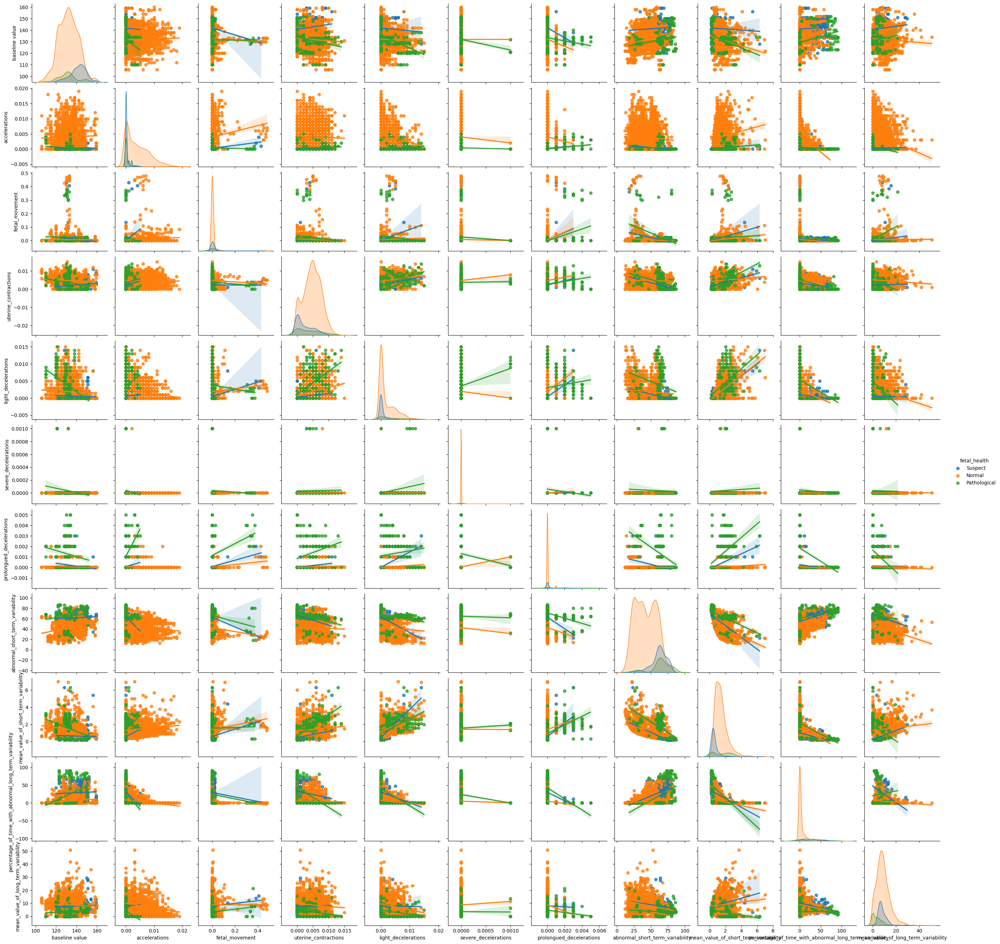

In [99]:
plt.figure(figsize=(10,8),dpi=80)
sns.pairplot(df[['baseline value', 'accelerations', 'fetal_movement',
       'uterine_contractions', 'light_decelerations', 'severe_decelerations',
       'prolongued_decelerations', 'abnormal_short_term_variability',
       'mean_value_of_short_term_variability',
       'percentage_of_time_with_abnormal_long_term_variability',
       'mean_value_of_long_term_variability','fetal_health']],kind='reg',hue='fetal_health')

<Figure size 800x640 with 0 Axes>

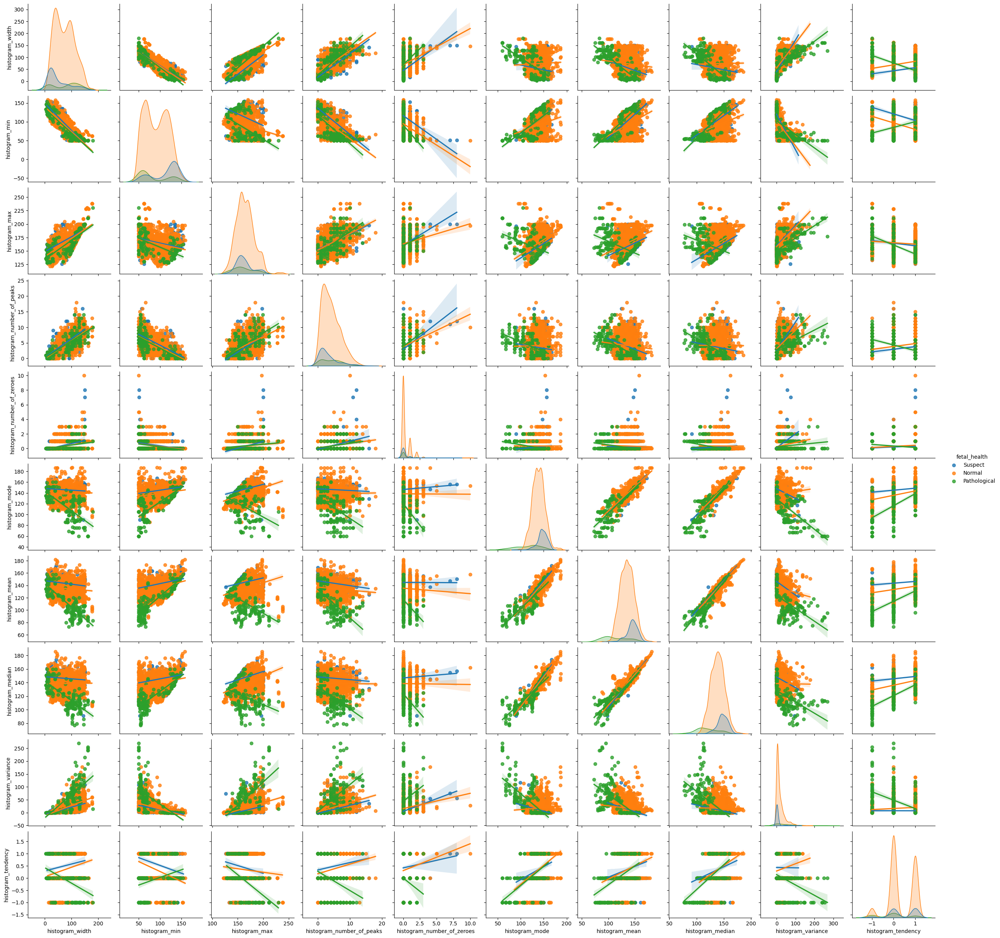

In [100]:
plt.figure(figsize=(10,8),dpi=80)
sns.pairplot(df[['histogram_width',
       'histogram_min', 'histogram_max', 'histogram_number_of_peaks',
       'histogram_number_of_zeroes', 'histogram_mode', 'histogram_mean',
       'histogram_median', 'histogram_variance', 'histogram_tendency','fetal_health']],kind='reg',hue='fetal_health')

## Modifying our data to only keep the selected features:

In [101]:
y = df['fetal_health']

X = df.drop(['fetal_health'], axis=1)


## Splitting the data into train and test sets:

In [102]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=46)

## Building and evaluating our models:

### 1. KNN - 90.6%

In [103]:
from sklearn.neighbors import KNeighborsClassifier

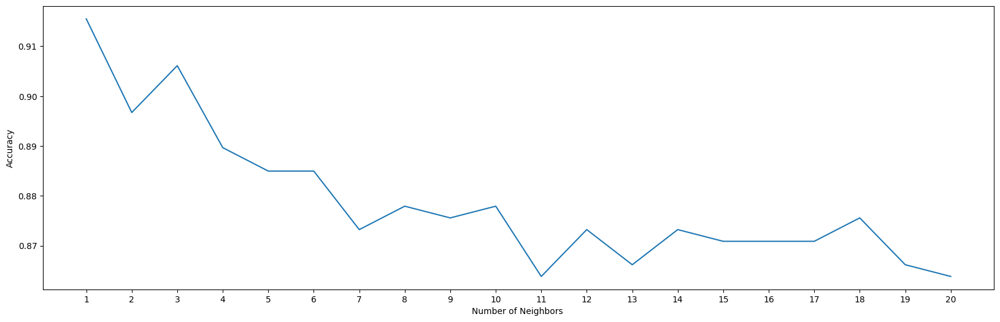

In [104]:
accuracy_overall= np.zeros(20)
for i in range(1,21):
    knn = KNeighborsClassifier(n_neighbors = i).fit(X_train,y_train)
    yhat= knn.predict(X_test)
    accuracy_overall[i-1] = accuracy_score(y_test, yhat)
loc = np.arange(1,21,step=1)
plt.figure(figsize = (20, 6))
plt.plot(range(1,21), accuracy_overall)
plt.xticks(loc)
plt.xlabel('Number of Neighbors ')
plt.ylabel('Accuracy')
plt.show()

In [105]:
knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(X_train, y_train)
y_pred = knn.predict(X_test)

# Evaluate the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)
print(classification_report(y_test,y_pred))
print("Accuracy:", accuracy)

              precision    recall  f1-score   support

      Normal       0.93      0.96      0.95       335
Pathological       0.97      0.84      0.90        38
     Suspect       0.67      0.58      0.63        53

    accuracy                           0.91       426
   macro avg       0.86      0.80      0.82       426
weighted avg       0.90      0.91      0.90       426

Accuracy: 0.9061032863849765


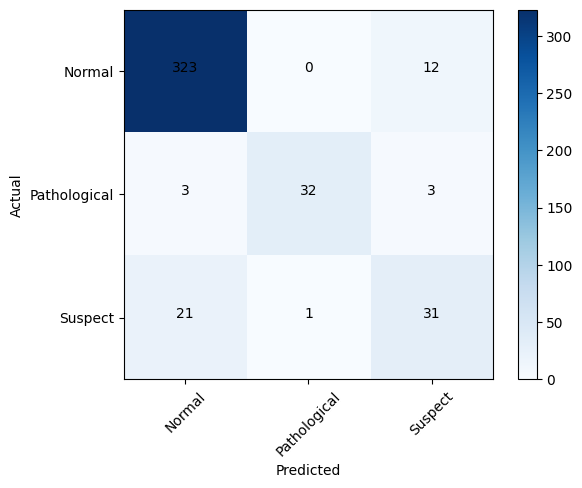

In [106]:

cm = confusion_matrix(y_test, y_pred)

plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.colorbar()

for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        plt.text(j, i, str(cm[i,j]), horizontalalignment="center", color="black")

tick_marks = np.arange(len(np.unique(y_test)))
plt.xticks(tick_marks, np.unique(y_test), rotation=45)
plt.yticks(tick_marks, np.unique(y_test))
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

### 2) Naive Bayes -  79.3%

In [107]:
from sklearn.naive_bayes import GaussianNB,MultinomialNB

nb = GaussianNB()
nb.fit(X_train, y_train)
y_pred_nb = nb.predict(X_test)

# Evaluate the accuracy of the model
accuracy = accuracy_score(y_test, y_pred_nb)
print(classification_report(y_test,y_pred_nb))
print("Accuracy:", accuracy)


              precision    recall  f1-score   support

      Normal       0.96      0.81      0.88       335
Pathological       0.56      0.74      0.64        38
     Suspect       0.41      0.74      0.53        53

    accuracy                           0.79       426
   macro avg       0.65      0.76      0.68       426
weighted avg       0.86      0.79      0.81       426

Accuracy: 0.7934272300469484


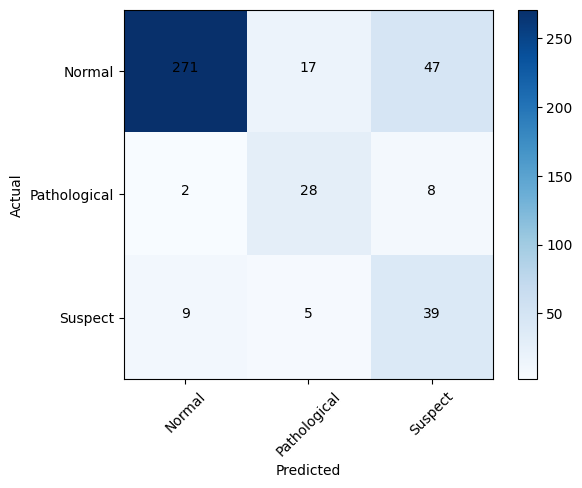

In [108]:
cm1 = confusion_matrix(y_test, y_pred_nb)
plt.imshow(cm1, interpolation='nearest', cmap=plt.cm.Blues)
plt.colorbar()

for i in range(cm1.shape[0]):
    for j in range(cm1.shape[1]):
        plt.text(j, i, str(cm1[i,j]), horizontalalignment="center", color="black")

tick_marks = np.arange(len(np.unique(y_test)))
plt.xticks(tick_marks, np.unique(y_test), rotation=45)
plt.yticks(tick_marks, np.unique(y_test))
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

## Logistic Regression

In [109]:
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression(random_state=42,C=.1)
lr.fit(X_train,y_train)
y_pred_lr = lr.predict(X_test)
accuracy = accuracy_score(y_test, y_pred_lr)
print(classification_report(y_test,y_pred_lr))
print("Accuracy:", accuracy)


              precision    recall  f1-score   support

      Normal       0.90      0.96      0.93       335
Pathological       0.84      0.71      0.77        38
     Suspect       0.50      0.36      0.42        53

    accuracy                           0.86       426
   macro avg       0.75      0.67      0.71       426
weighted avg       0.84      0.86      0.85       426

Accuracy: 0.8591549295774648


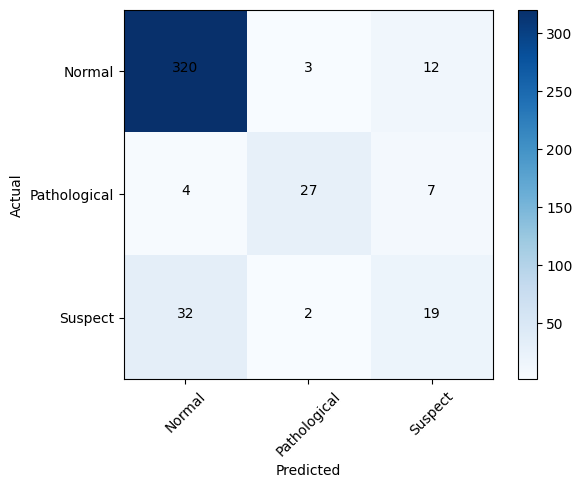

In [110]:
cm2 = confusion_matrix(y_test, y_pred_lr)
plt.imshow(cm2, interpolation='nearest', cmap=plt.cm.Blues)
plt.colorbar()

for i in range(cm2.shape[0]):
    for j in range(cm2.shape[1]):
        plt.text(j, i, str(cm2[i,j]), horizontalalignment="center", color="black")

tick_marks = np.arange(len(np.unique(y_test)))
plt.xticks(tick_marks, np.unique(y_test), rotation=45)
plt.yticks(tick_marks, np.unique(y_test))
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

## Decision Tree- 93.9%

In [111]:
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier

params = {
    'max_depth': [2, 3, 5, 10, 20],
    'min_samples_leaf': [5, 10, 20, 50, 100],
    'criterion': ["gini", "entropy"]
}
dtc = DecisionTreeClassifier(random_state=42)

grid_search = GridSearchCV(estimator=dtc, 
                           param_grid=params, 
                           cv=4, n_jobs=-1, verbose=1, scoring = "accuracy")
grid_search.fit(X_train, y_train)


Fitting 4 folds for each of 50 candidates, totalling 200 fits


GridSearchCV(cv=4, estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [2, 3, 5, 10, 20],
                         'min_samples_leaf': [5, 10, 20, 50, 100]},
             scoring='accuracy', verbose=1)

In [112]:
best_model = grid_search.best_estimator_
y_pred_tree = best_model.predict(X_test)
print(classification_report(y_test,best_model.predict(X_test)))
# print("Accuracy:", accuracy)

              precision    recall  f1-score   support

      Normal       0.96      0.97      0.96       335
Pathological       0.97      0.92      0.95        38
     Suspect       0.81      0.81      0.81        53

    accuracy                           0.94       426
   macro avg       0.91      0.90      0.91       426
weighted avg       0.94      0.94      0.94       426



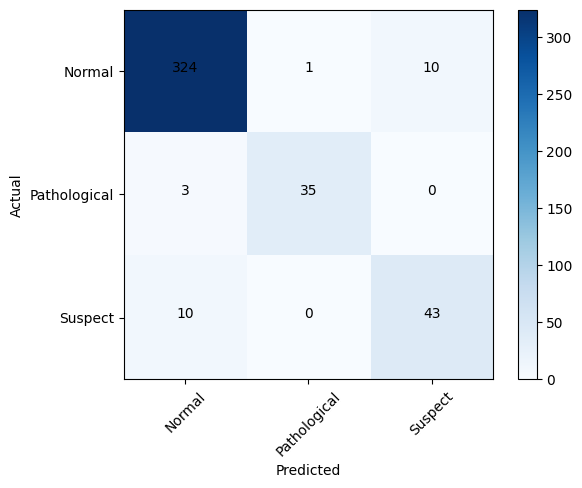

In [113]:
cm2 = confusion_matrix(y_test, y_pred_tree)
plt.imshow(cm2, interpolation='nearest', cmap=plt.cm.Blues)
plt.colorbar()

for i in range(cm2.shape[0]):
    for j in range(cm2.shape[1]):
        plt.text(j, i, str(cm2[i,j]), horizontalalignment="center", color="black")

tick_marks = np.arange(len(np.unique(y_test)))
plt.xticks(tick_marks, np.unique(y_test), rotation=45)
plt.yticks(tick_marks, np.unique(y_test))
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

[Text(0.4136652542372881, 0.96875, 'x[8] <= 0.55\ngini = 0.37\nsamples = 1700\nvalue = [1320, 138, 242]'),
 Text(0.2627118644067797, 0.90625, 'x[9] <= 68.5\ngini = 0.594\nsamples = 303\nvalue = [81, 56, 166]'),
 Text(0.1864406779661017, 0.84375, 'x[7] <= 59.5\ngini = 0.513\nsamples = 264\nvalue = [77, 21, 166]'),
 Text(0.0847457627118644, 0.78125, 'x[16] <= 153.5\ngini = 0.383\nsamples = 58\nvalue = [43, 0, 15]'),
 Text(0.03389830508474576, 0.71875, 'x[19] <= 2.5\ngini = 0.161\nsamples = 34\nvalue = [31, 0, 3]'),
 Text(0.01694915254237288, 0.65625, 'gini = 0.0\nsamples = 24\nvalue = [24, 0, 0]'),
 Text(0.05084745762711865, 0.65625, 'x[1] <= 0.001\ngini = 0.42\nsamples = 10\nvalue = [7, 0, 3]'),
 Text(0.03389830508474576, 0.59375, 'gini = 0.48\nsamples = 5\nvalue = [2, 0, 3]'),
 Text(0.06779661016949153, 0.59375, 'gini = 0.0\nsamples = 5\nvalue = [5, 0, 0]'),
 Text(0.13559322033898305, 0.71875, 'x[19] <= 4.5\ngini = 0.5\nsamples = 24\nvalue = [12, 0, 12]'),
 Text(0.11864406779661017, 0.

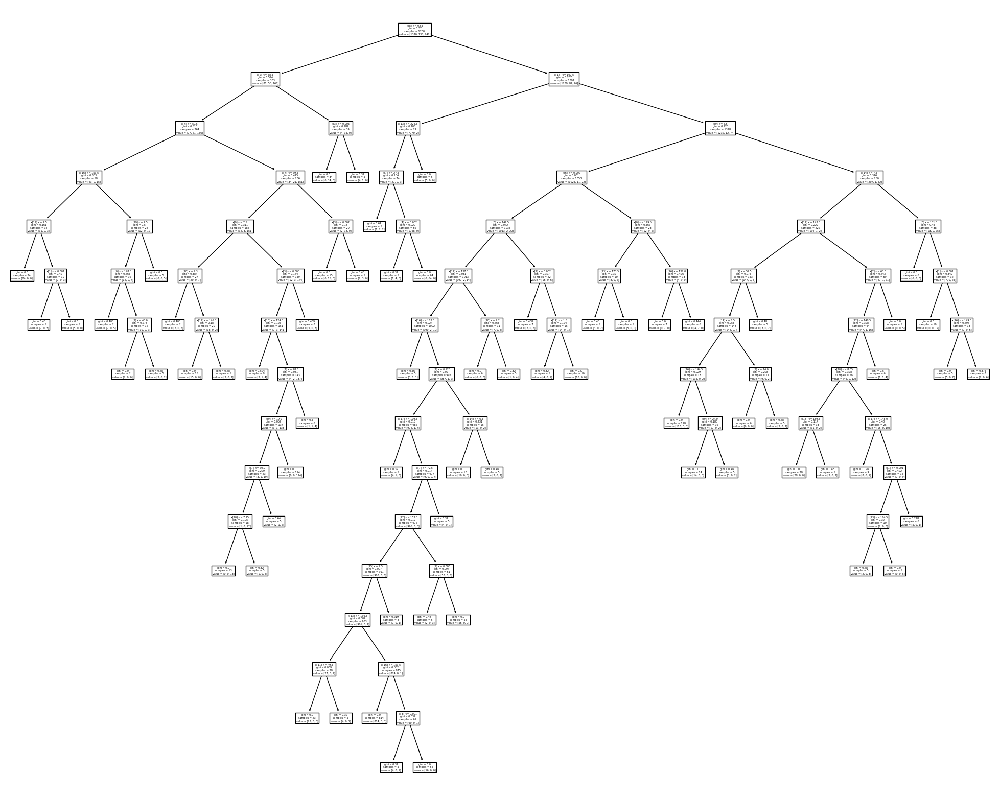

In [114]:
from sklearn import tree
fig = plt.figure(figsize=(25,20))
tree.plot_tree(best_model)

In [115]:
feat_dict= {}
for col, val in sorted(zip(X_train.columns,grid_search.best_estimator_.feature_importances_),key=lambda x:x[1],reverse=True):
  feat_dict[col]=val

feat_df = pd.DataFrame({'Feature':feat_dict.keys(),'Importance':feat_dict.values()})

feat_df

,Feature,Importance
0,mean_value_of_short_term_variability,0.294935
1,histogram_mean,0.224642
2,percentage_of_time_with_abnormal_long_term_var...,0.138936
3,abnormal_short_term_variability,0.114826
4,histogram_number_of_peaks,0.037582
5,accelerations,0.030553
6,baseline value,0.029442
7,histogram_mode,0.028040
8,uterine_contractions,0.022217
9,mean_value_of_long_term_variability,0.020200



## Random Forest - 95.5%

In [116]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 20, stop = 200, num = 100)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
print(random_grid)

{'n_estimators': [20, 21, 23, 25, 27, 29, 30, 32, 34, 36, 38, 40, 41, 43, 45, 47, 49, 50, 52, 54, 56, 58, 60, 61, 63, 65, 67, 69, 70, 72, 74, 76, 78, 80, 81, 83, 85, 87, 89, 90, 92, 94, 96, 98, 100, 101, 103, 105, 107, 109, 110, 112, 114, 116, 118, 120, 121, 123, 125, 127, 129, 130, 132, 134, 136, 138, 140, 141, 143, 145, 147, 149, 150, 152, 154, 156, 158, 160, 161, 163, 165, 167, 169, 170, 172, 174, 176, 178, 180, 181, 183, 185, 187, 189, 190, 192, 194, 196, 198, 200], 'max_features': ['auto', 'sqrt'], 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4], 'bootstrap': [True, False]}


In [117]:
rf = RandomForestClassifier()
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
rf_random.fit(X_train,y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [10, 20, 30, 40, 50, 60,
                                                      70, 80, 90, 100, 110,
                                                      None],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [20, 21, 23, 25, 27, 29,
                                                         30, 32, 34, 36, 38, 40,
                                                         41, 43, 45, 47, 49, 50,
                                                         52, 54, 56, 58, 60, 61,
                                                         63, 65, 67, 69, 70, 72, ...]},
                   random_state=42, verbose=2)

In [118]:
my_RF= rf_random.best_estimator_
y_pred_rf = my_RF.predict(X_test)


# Calculate accuracy score
accuracy = accuracy_score(y_test, y_pred_rf)
print(classification_report(y_test,y_pred_rf))
print("Accuracy:", accuracy)


              precision    recall  f1-score   support

      Normal       0.96      0.98      0.97       335
Pathological       0.94      0.89      0.92        38
     Suspect       0.84      0.81      0.83        53

    accuracy                           0.95       426
   macro avg       0.92      0.89      0.91       426
weighted avg       0.95      0.95      0.95       426

Accuracy: 0.9483568075117371


In [119]:
my_RF.get_params()

{'bootstrap': False,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': 100,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 10,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}

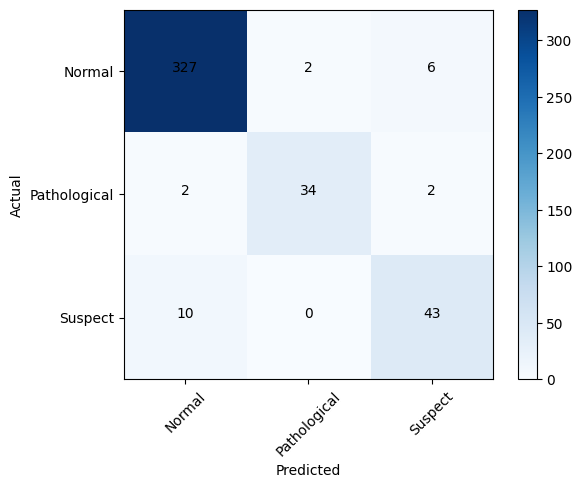

In [120]:
cm2 = confusion_matrix(y_test, y_pred_rf)
plt.imshow(cm2, interpolation='nearest', cmap=plt.cm.Blues)
plt.colorbar()

for i in range(cm2.shape[0]):
    for j in range(cm2.shape[1]):
        plt.text(j, i, str(cm2[i,j]), horizontalalignment="center", color="black")

tick_marks = np.arange(len(np.unique(y_test)))
plt.xticks(tick_marks, np.unique(y_test), rotation=45)
plt.yticks(tick_marks, np.unique(y_test))
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [121]:
feat_dict= {}
for col, val in sorted(zip(X_train.columns,my_RF.feature_importances_),key=lambda x:x[1],reverse=True):
  feat_dict[col]=val

feat_df = pd.DataFrame({'Feature':feat_dict.keys(),'Importance':feat_dict.values()})

feat_df

,Feature,Importance
0,abnormal_short_term_variability,0.152865
1,percentage_of_time_with_abnormal_long_term_var...,0.143730
2,mean_value_of_short_term_variability,0.109677
3,histogram_mean,0.107872
4,histogram_mode,0.053505
5,accelerations,0.050288
6,prolongued_decelerations,0.048369
7,histogram_median,0.046476
8,histogram_min,0.042757
9,baseline value,0.038554


## Random forest with class weights :  94.1%

In [122]:
from sklearn.ensemble import RandomForestClassifier

rf1 = RandomForestClassifier(random_state=0, 
                               max_depth=100, max_features='auto',
                       min_samples_leaf=2, n_estimators=54, class_weight = {'Normal':1, 'Pathological': 2,  'Suspect': 2}
)
rf1.fit(X_train, y_train)


RandomForestClassifier(class_weight={'Normal': 1, 'Pathological': 2,
                                     'Suspect': 2},
                       max_depth=100, max_features='auto', min_samples_leaf=2,
                       n_estimators=54, random_state=0)

In [123]:
y_pred_rf1 = rf1.predict(X_test)


# Calculate accuracy score
accuracy = accuracy_score(y_test, y_pred_rf1)
print(classification_report(y_test,y_pred_rf1))
print("Accuracy:", accuracy)


              precision    recall  f1-score   support

      Normal       0.97      0.96      0.96       335
Pathological       0.92      0.92      0.92        38
     Suspect       0.78      0.81      0.80        53

    accuracy                           0.94       426
   macro avg       0.89      0.90      0.89       426
weighted avg       0.94      0.94      0.94       426

Accuracy: 0.9389671361502347


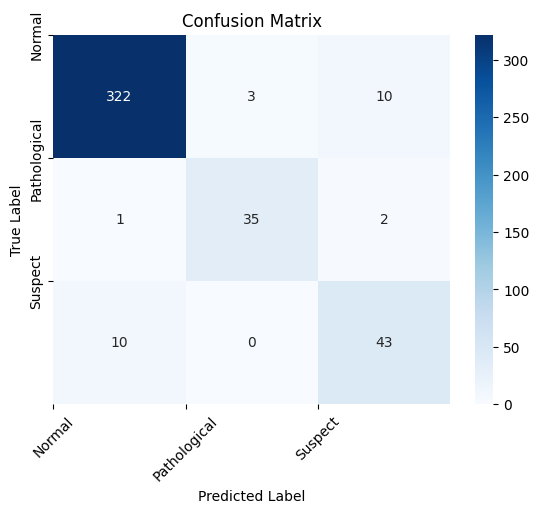

In [124]:
cm4 = confusion_matrix(y_test, y_pred_rf1)
sns.heatmap(cm4, annot=True, cmap="Blues", fmt="d", xticklabels=np.unique(y_test), yticklabels=np.unique(y_test))
tick_marks = np.arange(len(np.unique(y_test)))
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.xticks(tick_marks, np.unique(y_test), rotation=45)
plt.yticks(tick_marks, np.unique(y_test))
plt.ylabel('True Label')
plt.show()

In [125]:
# t = pd.DataFrame({'Act':y_test , 'Pred':y_pred_rf})

# t[(t['Act']==1) & (t['Pred']==0)]


## XGBoost - 96.2%

In [126]:
map = {k:v for v,k in map.items()}

In [127]:
from xgboost import XGBClassifier
params = {
      
        'n_estimators':[10,20,30] ,
        'min_child_weight': [1, 5, 10],
        'colsample_bytree': [0.6, 0.8, 1.0],
        }
xgb = XGBClassifier()

random_search = GridSearchCV(xgb, param_grid=params, scoring='accuracy', n_jobs=4, cv=3, verbose=3 )
y_train = y_train.map(map)
random_search.fit(X_train, y_train)
# from xgboost import XGBClassifier

# xgb = XGBClassifier(n_estimators = 30 )

# xgb.fit(X_train, y_train)

Fitting 3 folds for each of 27 candidates, totalling 81 fits


GridSearchCV(cv=3,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     gpu_id=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None, predictor=None,
                                     random_state=None, ...),
             n_jobs=4,
             param_grid={'colsample_bytree': [0.6, 0.8, 1.0],
                         'min_child_weight': [1, 5, 10],
                         'n_estimators': [10, 20, 30]},
             scoring='accuracy', verbose=3)

In [128]:
y_pred_xgb = pd.Series(random_search.best_estimator_.predict(X_test))

# map = {v:k for k,v in map.items()}
map = {k:v for v,k in map.items()}

y_pred_xgb = y_pred_xgb.map(map)
accuracy = accuracy_score(y_test, y_pred_xgb)
print(classification_report(y_test,y_pred_xgb))
print("Accuracy:", accuracy)


              precision    recall  f1-score   support

      Normal       0.98      0.98      0.98       335
Pathological       0.95      0.95      0.95        38
     Suspect       0.87      0.89      0.88        53

    accuracy                           0.96       426
   macro avg       0.93      0.94      0.93       426
weighted avg       0.96      0.96      0.96       426

Accuracy: 0.9624413145539906


In [129]:
random_search.best_estimator_.get_params()

{'objective': 'multi:softprob',
 'use_label_encoder': None,
 'base_score': None,
 'booster': None,
 'callbacks': None,
 'colsample_bylevel': None,
 'colsample_bynode': None,
 'colsample_bytree': 1.0,
 'early_stopping_rounds': None,
 'enable_categorical': False,
 'eval_metric': None,
 'feature_types': None,
 'gamma': None,
 'gpu_id': None,
 'grow_policy': None,
 'importance_type': None,
 'interaction_constraints': None,
 'learning_rate': None,
 'max_bin': None,
 'max_cat_threshold': None,
 'max_cat_to_onehot': None,
 'max_delta_step': None,
 'max_depth': None,
 'max_leaves': None,
 'min_child_weight': 1,
 'missing': nan,
 'monotone_constraints': None,
 'n_estimators': 30,
 'n_jobs': None,
 'num_parallel_tree': None,
 'predictor': None,
 'random_state': None,
 'reg_alpha': None,
 'reg_lambda': None,
 'sampling_method': None,
 'scale_pos_weight': None,
 'subsample': None,
 'tree_method': None,
 'validate_parameters': None,
 'verbosity': None}

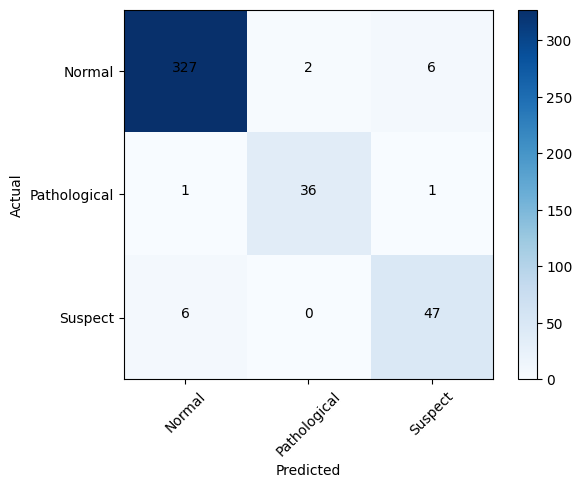

In [130]:
cm2 = confusion_matrix(y_test, y_pred_xgb)
plt.imshow(cm2, interpolation='nearest', cmap=plt.cm.Blues)
plt.colorbar()

for i in range(cm2.shape[0]):
    for j in range(cm2.shape[1]):
        plt.text(j, i, str(cm2[i,j]), horizontalalignment="center", color="black")

tick_marks = np.arange(len(np.unique(y_test)))
plt.xticks(tick_marks, np.unique(y_test), rotation=45)
plt.yticks(tick_marks, np.unique(y_test))
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [131]:
feat_dict= {}
for col, val in sorted(zip(X_train.columns,random_search.best_estimator_.feature_importances_),key=lambda x:x[1],reverse=True):
  feat_dict[col]=val

feat_df = pd.DataFrame({'Feature':feat_dict.keys(),'Importance':feat_dict.values()})

feat_df

,Feature,Importance
0,mean_value_of_short_term_variability,0.402351
1,histogram_mean,0.129688
2,percentage_of_time_with_abnormal_long_term_var...,0.082175
3,accelerations,0.050386
4,abnormal_short_term_variability,0.046953
5,prolongued_decelerations,0.039222
6,baseline value,0.031928
7,uterine_contractions,0.028906
8,histogram_number_of_peaks,0.027369
9,histogram_mode,0.022370


## Light GBM - 96.7%

In [132]:
from lightgbm import LGBMClassifier
params = {
      
       'num_leaves': [31,41,51,61,71],
       'min_child_samples': range(10,50,5),
       'min_child_weight':[0.001,0.01,0.1,1],
       
       
       
        }
lgb = LGBMClassifier()

random_search = GridSearchCV(lgb, param_grid=params, scoring='accuracy', n_jobs=5, cv=5, verbose=3 )


random_search.fit(X_train, y_train)

y_pred_xgb = pd.Series(random_search.best_estimator_.predict(X_test))
y_pred_xgb = y_pred_xgb.map(map)
# Calculate accuracy score
accuracy = accuracy_score(y_test, y_pred_xgb)
print(classification_report(y_test,y_pred_xgb))
print("Accuracy:", accuracy)




Fitting 5 folds for each of 160 candidates, totalling 800 fits
              precision    recall  f1-score   support

      Normal       0.98      0.98      0.98       335
Pathological       0.97      0.95      0.96        38
     Suspect       0.86      0.91      0.88        53

    accuracy                           0.97       426
   macro avg       0.94      0.94      0.94       426
weighted avg       0.97      0.97      0.97       426

Accuracy: 0.9671361502347418


In [133]:
random_search.best_estimator_.get_params()

{'boosting_type': 'gbdt',
 'class_weight': None,
 'colsample_bytree': 1.0,
 'importance_type': 'split',
 'learning_rate': 0.1,
 'max_depth': -1,
 'min_child_samples': 10,
 'min_child_weight': 0.001,
 'min_split_gain': 0.0,
 'n_estimators': 100,
 'n_jobs': -1,
 'num_leaves': 61,
 'objective': None,
 'random_state': None,
 'reg_alpha': 0.0,
 'reg_lambda': 0.0,
 'silent': 'warn',
 'subsample': 1.0,
 'subsample_for_bin': 200000,
 'subsample_freq': 0}

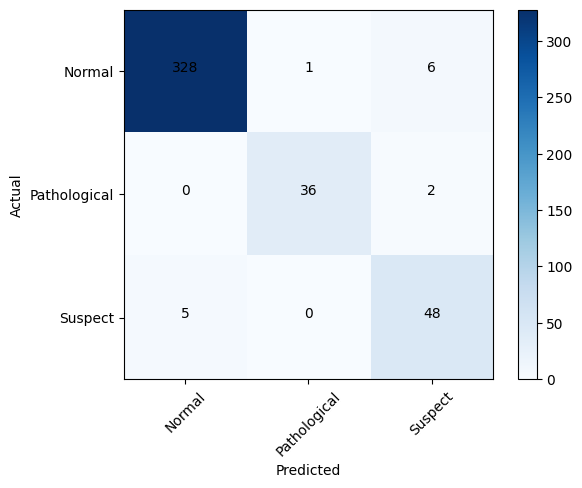

In [134]:
cm5 = confusion_matrix(y_test, y_pred_xgb)
plt.imshow(cm5, interpolation='nearest', cmap=plt.cm.Blues)
plt.colorbar()

for i in range(cm5.shape[0]):
    for j in range(cm5.shape[1]):
        plt.text(j, i, str(cm5[i,j]), horizontalalignment="center", color="black")

tick_marks = np.arange(len(np.unique(y_test)))
plt.xticks(tick_marks, np.unique(y_test), rotation=45)
plt.yticks(tick_marks, np.unique(y_test))
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [135]:
feat_dict= {}
for col, val in sorted(zip(X_train.columns,random_search.best_estimator_.feature_importances_),key=lambda x:x[1],reverse=True):
  feat_dict[col]=val

feat_df = pd.DataFrame({'Feature':feat_dict.keys(),'Importance':feat_dict.values()})

feat_df

,Feature,Importance
0,abnormal_short_term_variability,2071
1,percentage_of_time_with_abnormal_long_term_var...,1846
2,mean_value_of_long_term_variability,1208
3,histogram_mean,1082
4,histogram_mode,1081
5,baseline value,1048
6,histogram_min,1014
7,histogram_width,999
8,histogram_max,959
9,uterine_contractions,795


## Neural Networks: MLP - 89%

In [136]:
from sklearn.neural_network import MLPClassifier
NN = MLPClassifier()
NN.fit(X_train, y_train)
y_pred_nn = NN.predict(X_test)

In [137]:
y_pred_nn = pd.Series(y_pred_nn).map(map)

In [138]:
# Calculate accuracy score
accuracy = accuracy_score(y_test, y_pred_nn)
print(classification_report(y_test,y_pred_nn))
print("Accuracy:", accuracy)

              precision    recall  f1-score   support

      Normal       0.93      0.90      0.92       335
Pathological       0.84      0.71      0.77        38
     Suspect       0.45      0.58      0.51        53

    accuracy                           0.85       426
   macro avg       0.74      0.73      0.73       426
weighted avg       0.86      0.85      0.85       426

Accuracy: 0.8450704225352113


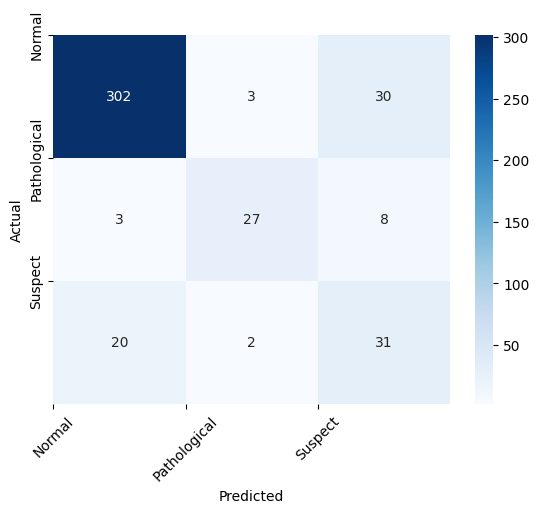

In [139]:
cm6 = confusion_matrix(y_test, y_pred_nn)
sns.heatmap(cm6, annot=True, cmap="Blues", fmt="d", xticklabels=['1', '2', '3'], yticklabels=['1', '2', '3'])

tick_marks = np.arange(len(np.unique(y_test)))
plt.xticks(tick_marks, np.unique(y_test), rotation=45)
plt.yticks(tick_marks, np.unique(y_test))
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

## Neural Networks - 87%

In [140]:
from keras.utils import np_utils
from keras.models import Sequential
from keras.layers import Dense, Dropout

In [141]:
y_train

1211    1
1095    0
616     0
1467    0
363     2
       ..
823     2
544     1
1340    0
658     0
1576    0
Name: fetal_health, Length: 1700, dtype: int64

In [142]:
y_train.value_counts()
target_map ={'Normal':0, 'Suspect':1, 'Pathological':2}
y_train2= y_train

In [143]:
y = np_utils.to_categorical(y_train2.values)

In [144]:
nn1 = Sequential()
nn1.add(Dense(64, activation='relu', input_shape=(21,)))
nn1.add(Dense(32, activation='relu'))
nn1.add(Dense(3, activation='softmax'))

In [145]:
nn1.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_3 (Dense)             (None, 64)                1408      
                                                                 
 dense_4 (Dense)             (None, 32)                2080      
                                                                 
 dense_5 (Dense)             (None, 3)                 99        
                                                                 
Total params: 3587 (14.01 KB)
Trainable params: 3587 (14.01 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [146]:
nn1.compile(loss='binary_crossentropy',
optimizer='sgd',
metrics=['accuracy'])
nn1.fit(X_train, y,epochs=50, batch_size=64, verbose=1)

Epoch 1/50
27/27 [==============================] - 1s 2ms/step - loss: 3.6006 - accuracy: 0.7459
Epoch 2/50
27/27 [==============================] - 0s 2ms/step - loss: 0.3352 - accuracy: 0.7765
Epoch 3/50
27/27 [==============================] - 0s 2ms/step - loss: 0.3161 - accuracy: 0.7776
Epoch 4/50
27/27 [==============================] - 0s 3ms/step - loss: 0.2954 - accuracy: 0.7794
Epoch 5/50
27/27 [==============================] - 0s 3ms/step - loss: 0.2990 - accuracy: 0.7924
Epoch 6/50
27/27 [==============================] - 0s 3ms/step - loss: 0.2867 - accuracy: 0.7947
Epoch 7/50
27/27 [==============================] - 0s 3ms/step - loss: 0.2814 - accuracy: 0.7994
Epoch 8/50
27/27 [==============================] - 0s 2ms/step - loss: 0.2745 - accuracy: 0.8035
Epoch 9/50
27/27 [==============================] - 0s 2ms/step - loss: 0.2802 - accuracy: 0.8076
Epoch 10/50
27/27 [==============================] - 0s 3ms/step - loss: 0.2633 - accuracy: 0.8153
Epoch 11/50
27/27 [

In [147]:
y_pred_nn1 = nn1.predict(X_test).argmax(axis=-1)

14/14 [==============================] - 0s 1ms/step


In [148]:
inv_target = {0:'Normal',1: 'Suspect',2: 'Pathological'}
out = pd.DataFrame(y_pred_nn1).rename(columns = {0:'pred_value'})['pred_value'].map(inv_target)
out

0       Normal
1       Normal
2       Normal
3       Normal
4      Suspect
        ...   
421    Suspect
422     Normal
423     Normal
424     Normal
425     Normal
Name: pred_value, Length: 426, dtype: object

In [149]:
# Calculate accuracy score
accuracy = accuracy_score(y_test, out)
print(classification_report(y_test,out))
print("Accuracy:", accuracy)


              precision    recall  f1-score   support

      Normal       0.91      0.93      0.92       335
Pathological       0.83      0.79      0.81        38
     Suspect       0.50      0.45      0.48        53

    accuracy                           0.86       426
   macro avg       0.75      0.72      0.74       426
weighted avg       0.85      0.86      0.86       426

Accuracy: 0.8591549295774648


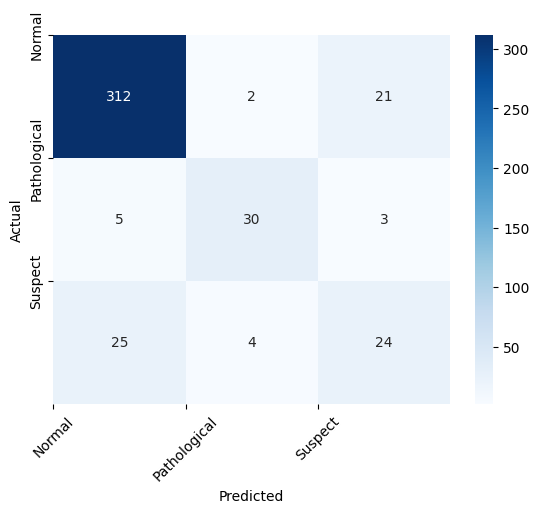

In [150]:
cm7 = confusion_matrix(y_test, out)
sns.heatmap(cm7, annot=True, cmap="Blues", fmt="d", xticklabels=['1', '2', '3'], yticklabels=['1', '2', '3'])

tick_marks = np.arange(len(np.unique(y_test)))
plt.xticks(tick_marks, np.unique(y_test), rotation=45)
plt.yticks(tick_marks, np.unique(y_test))
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()